In [1]:
# import spatialdata as sd
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pathlib import Path
from anndata import AnnData
import anndata as ad
import scvi
from scib_metrics.benchmark import Benchmarker

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
import warnings
warnings.filterwarnings('ignore')

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/sagar87/EMBO-multi-omics-course/blob/day3/horizontal_integration/day3/2-horizontal_integration.ipynb)

In [ ]:
# Install scPCA + dependencies
!pip install --quiet scanpy scikit-misc scib-metrics scvi-tools scanorama harmonypy bbknn

In [ ]:
# Download the data (if run on colab)
!wget https://www.huber.embl.de/users/harald/embo/integrated.h5ad /content/integrated.h5ad
!wget https://www.huber.embl.de/users/harald/embo/xenium_rep1.h5ad /content/xenium_rep1.h5ad
!wget https://www.huber.embl.de/users/harald/embo/scFFPE_raw.h5ad /content/scFFPE_raw.h5ad
!wget https://www.huber.embl.de/users/harald/embo/benchmark.csv /content/benchmark.csv

# Practical Day 3: Day 3: Integrative analysis of droplet-based single-cell and spatial data


![image.png](https://github.com/10XGenomics/janesick_nature_comms_2023_companion/blob/main/figures/F1.large.jpg?raw=true)


This notebook demonstrates the integration of Xenium and scFFPE-seq data from a serial formalin-fixed, paraffin-embedded (FFPE) human breast cancer section. We first analyse both datasets independently and perform mild preprocessing of the data. Then, we apply a range of different integration tools to jointly embed the data on the set of genes which are present in both datasets.

## Part 2: Horizontal data integration

### Helper functions

In [3]:
cell_type_color = {
    'B_Cells': '#565DFD',
    'CD4+_T_Cells': '#4fa9ff',
    'CD8+_T_Cells': '#1068be',
    'DCIS_1': '#fb34cd',
    'DCIS_2': '#FE664D',
    'Endothelial': '#01257b',
    'IRF7+_DCs': '#9f50f9',
    'Invasive_Tumor': '#ff002a',
    'LAMP3+_DCs': '#AB76AE',
    'Macrophages_1': '#10686f',
    'Macrophages_2': '#3694a8',
    'Mast_Cells': '#999999',
    'Myoepi_ACTA2+': '#009203',
    'Myoepi_KRT15+': '#66c102',
    'Perivascular-Like': '#515151',
    'Prolif_Invasive_Tumor': '#8e0119',
    'Stromal': '#e5e022',
    'Stromal_&_T_Cell_Hybrid': '#C1A029',
    'T_Cell_&_Tumor_Hybrid': '#CB6035',
    'Unlabeled': '#ffa5aa'
}


def umap(adata: AnnData, basis: str, neighbors_kwargs: dict = {}, umap_kwargs: dict = {}):
    """
    Helper function to performs UMAP dimensionality reduction on an AnnData object.

    Parameters
    ----------
    adata : AnnData
        The AnnData object containing the data to be processed.
    basis : str
        The basis to use for the UMAP calculation.
    neighbors_kwargs : dict, optional
        Additional keyword arguments to be passed to `sc.pp.neighbors` function.
        Default is an empty dictionary.
    umap_kwargs : dict, optional
        Additional keyword arguments to be passed to `sc.tl.umap` function.
        Default is an empty dictionary.

    Returns
    -------
    None

    Notes
    -----
    This function performs UMAP dimensionality reduction on the input `adata` object
    using the specified `basis`. If the `basis` a PCA is computed. It then first computes 
    the neighbors graph using the `sc.pp.neighbors` function, with the option to provide 
    additional keyword arguments via `neighbors_kwargs`. Then, it applies the UMAP algorithm 
    using the `sc.tl.umap` function, with the option to provide additional keyword arguments 
    via `umap_kwargs`. Finally, it stores the UMAP coordinates in the `obsm` attribute of the 
    `adata` object under the key `"{basis}_umap"`, and removes the original `"X_umap"` 
    coordinates.

    Example
    -------
    >>> adata = AnnData(X)
    >>> umap(adata, basis="pca", neighbors_kwargs={"n_neighbors": 10}, umap_kwargs={"min_dist": 0.5})

    """
    if (basis not in adata.obsm) and (f'X_{basis}' not in adata.obsm):
        sc.pp.pca(adata, n_comps=20)
        adata.uns[basis] = adata.uns['pca']
        adata.obsm[f'X_{basis}'] = adata.obsm['X_pca']
        adata.varm[f'PCs_{basis}'] = adata.varm['PCs']
        
        del adata.obsm['X_pca']
        del adata.uns['pca']
        del adata.varm['PCs']
        
    
    if f'X_{basis}' in adata.obsm:
        basis = f'X_{basis}'
        
    sc.pp.neighbors(adata, use_rep=f"{basis}", key_added=f"{basis}", **neighbors_kwargs)
    sc.tl.umap(adata, neighbors_key=f"{basis}", **umap_kwargs)
    adata.obsm[f"{basis}_umap"] = adata.obsm["X_umap"]
    del adata.obsm["X_umap"]

### Load data

The following cells load the Xenium an and scFFPE-seq data.

In [4]:
# Note: adjust paths
xenium = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/xenium_rep1.h5ad')

In [5]:
scffpe = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/scFFPE_raw.h5ad')

### Optional: Downsample the Xenium dataset

To make things a bit faster ...

In [6]:
xenium = xenium[xenium.obs.sample(scffpe.shape[0]).index]

### EDA - Exploratory data analysis

#### Xenium data

We first inspect the two datasets independently, starting with the Xenium dataset.

In [7]:
xenium

View of AnnData object with n_obs × n_vars = 27460 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'Cluster', 'replicate'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'Cluster_colors'
    obsm: 'spatial'

The `anndata` contains the spatial coordinates of each cell in its `obsm` field. To visualise the data, we employ the `sc.pl.embedding` function and pass the arguments `spatial` and `Cluster` to inspect the structure of the tissue. 

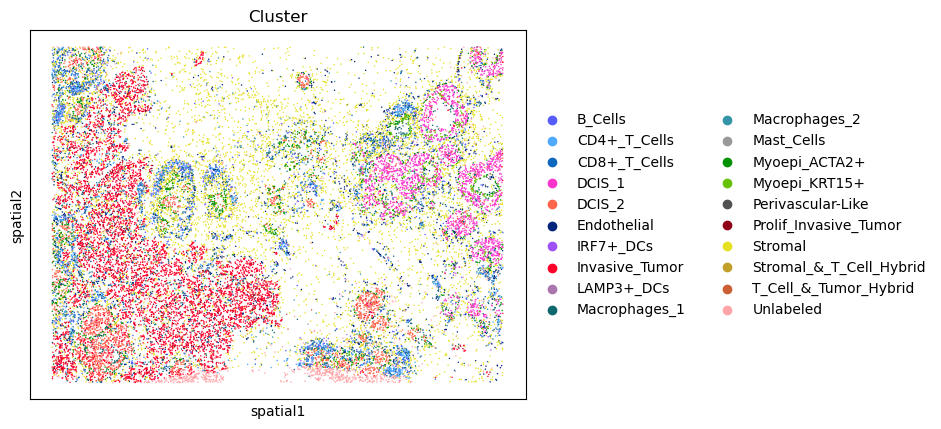

In [8]:
sc.pl.embedding(xenium, 'spatial', color='Cluster')

Next, we continue with some basic preprocessing of the data. 

In [9]:
sc.pp.calculate_qc_metrics(xenium, percent_top=(10, 20, 50, 150), inplace=True)

Next we plot the distribution of total transcripts per cell, unique transcripts per cell, area of segmented cells and the ratio of nuclei area to their cells (adapted from the Squidpy tutorial).



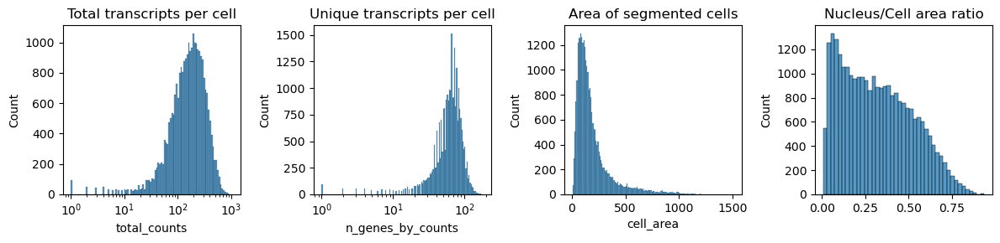

In [10]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    xenium.obs["total_counts"],
    log_scale=True,
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    xenium.obs["n_genes_by_counts"],
    log_scale=True,
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Area of segmented cells")
sns.histplot(
    xenium.obs["cell_area"],
    ax=axs[2],
)

axs[3].set_title("Nucleus/Cell area ratio")
sns.histplot(
    xenium.obs["nucleus_area"] / xenium.obs["cell_area"],
    ax=axs[3],
)
plt.tight_layout()

We filter the cells based on the minimum number of counts required using `sc.pp.filter_cells`. Filter the genes based on the minimum number of cells required with `sc.pp.filter_genes`. The parameters for the both were specified based on the plots above. They were set to filter out the cells and genes with minimum counts and minimum cells respectively.

In [11]:
sc.pp.filter_cells(xenium, min_counts=10)
sc.pp.filter_genes(xenium, min_cells=5)

We then proceed with the standard protocol for preprocessing the single-cell RNA counts. We save the original count data in the `layer` field of the `anndata` object and proceed with normalising the logCP10K transformation.

In [12]:
xenium.layers["counts"] = xenium.X.copy()
sc.pp.normalize_total(xenium, inplace=True, target_sum=1e4)
sc.pp.log1p(xenium)

Next, we produce a UMAP (based on PCA embeddings) to obtain an overview of the data.

In [13]:
umap(xenium, basis='pca_xenium')

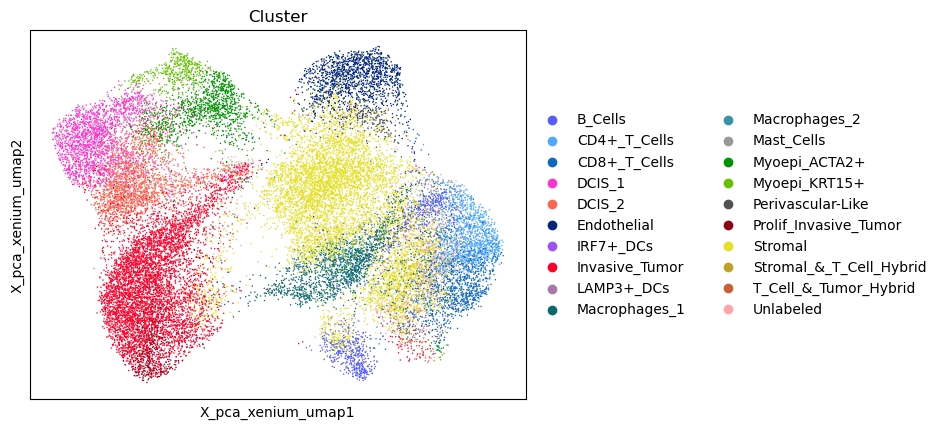

In [14]:
sc.pl.embedding(xenium, basis='X_pca_xenium_umap', color='Cluster')

#### scFFPE-seq

We perform some quality control for the scFFPE-seq. For now, we will filter out cells that do not pass QC.


In [15]:
scffpe.var['mt'] = scffpe.var_names.str.startswith('MT-')

In [16]:
# scffpe.obs['n_genes'] = (scffpe.X > 0).sum(1)

In [17]:
sc.pp.calculate_qc_metrics(scffpe, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [18]:
scffpe

AnnData object with n_obs × n_vars = 27460 × 18082
    obs: 'Cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Cluster_colors'

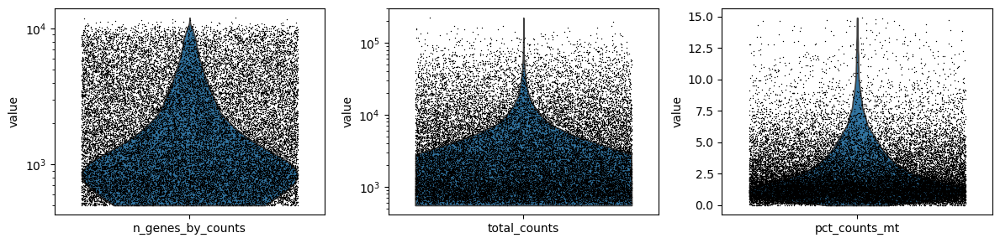

In [19]:
fig, ax = plt.subplots(1, 3, figsize=(12, 3))
sc.pl.violin(scffpe, 'n_genes_by_counts',  jitter=0.4, ax=ax[0], show=False)
ax[0].set_yscale('log')
sc.pl.violin(scffpe, 'total_counts',  jitter=0.4, ax=ax[1], show=False)
ax[1].set_yscale('log')
sc.pl.violin(scffpe, 'pct_counts_mt',  jitter=0.4, ax=ax[2], show=False)
plt.tight_layout()

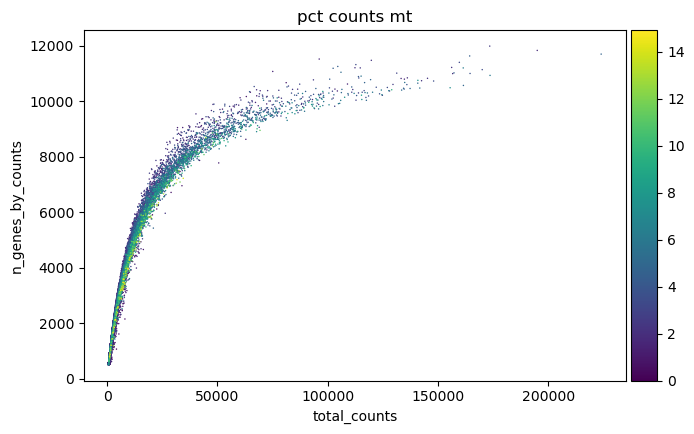

In [20]:
#Data quality summary plots
p1 = sc.pl.scatter(scffpe, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

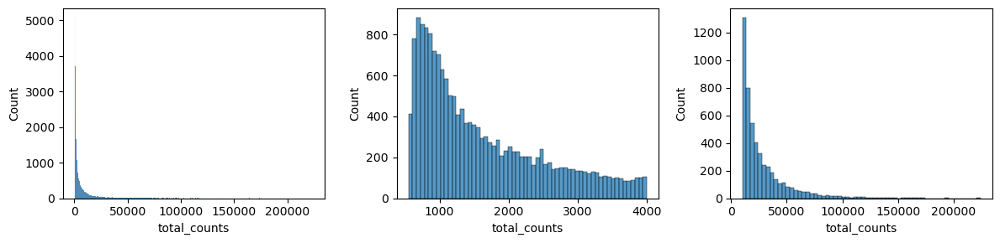

In [21]:
fig, ax = plt.subplots(1, 3, figsize=(12, 3))

sns.histplot(scffpe.obs['total_counts'], kde=False, ax=ax[0])
sns.histplot(scffpe.obs['total_counts'][scffpe.obs['total_counts']<4000], kde=False, bins=60, ax=ax[1])
sns.histplot(scffpe.obs['total_counts'][scffpe.obs['total_counts']>10000], kde=False, bins=60, ax=ax[2])
plt.tight_layout()

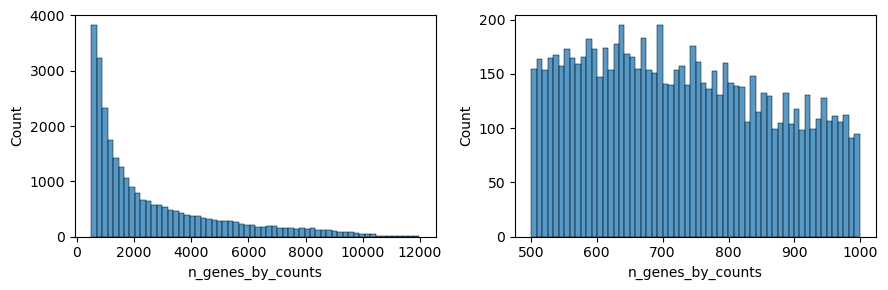

In [22]:
fig, ax = plt.subplots(1, 2, figsize=(9, 3))
#Thresholding decision: genes
sns.histplot(scffpe.obs['n_genes_by_counts'], kde=False, bins=60, ax=ax[0])
sns.histplot(scffpe.obs['n_genes_by_counts'][scffpe.obs['n_genes_by_counts']<1000], kde=False, bins=60, ax=ax[1])
plt.tight_layout()

We filter some of the cells with very large counts.

In [23]:
sc.pp.filter_cells(scffpe, max_counts = 1e5)

And finish the preprocessing by lognormalizing the counts.

In [24]:
scffpe.layers["counts"] = scffpe.X.copy()
sc.pp.normalize_total(scffpe, inplace=True, target_sum=1e4)
sc.pp.log1p(scffpe)

In [25]:
umap(scffpe, basis='pca_scffpe')

In [26]:
scffpe

AnnData object with n_obs × n_vars = 27371 × 18082
    obs: 'Cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Cluster_colors', 'log1p', 'pca_scffpe', 'X_pca_scffpe', 'umap'
    obsm: 'X_pca_scffpe', 'X_pca_scffpe_umap'
    varm: 'PCs_pca_scffpe'
    layers: 'counts'
    obsp: 'X_pca_scffpe_distances', 'X_pca_scffpe_connectivities'

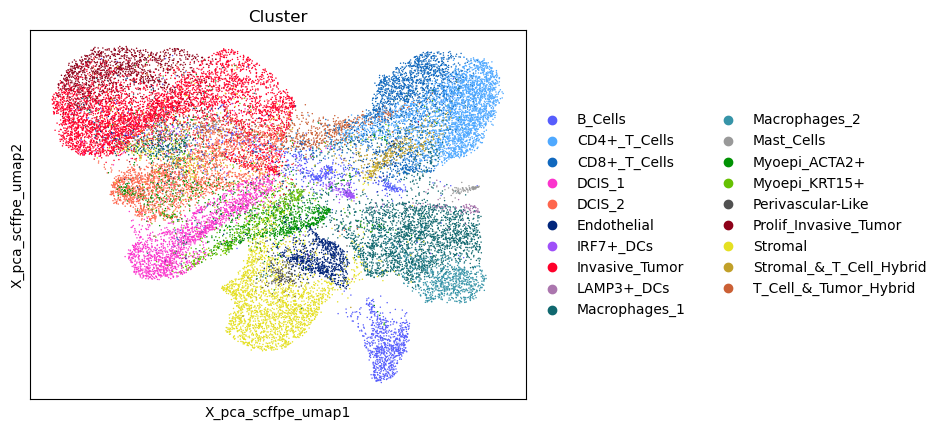

In [27]:
sc.pl.embedding(scffpe, basis='X_pca_scffpe_umap', color='Cluster')

### Concatenate the data

We add the batch variable `Tech` to both `anndata` objects and concatenate both objects.

In [28]:
# Note adjust: paths
xenium_concat = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/xenium_rep1.h5ad')
scffpe_concat = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/scFFPE_raw.h5ad')

In [29]:
xenium_concat.obs['Tech'] = 'xenium'

In [30]:
scffpe_concat.obs['Tech'] = 'scffpe'

In [31]:
xenium_concat = xenium_concat[xenium.obs.index]

In [32]:
scffpe_concat = scffpe_concat[scffpe.obs.index]

In [33]:
adata = ad.concat([xenium_concat, scffpe_concat])

In [34]:
adata.layers['counts'] = adata.X

In [35]:
adata.uns['Cluster_colors'] = [ cell_type_color[x] for x in  adata.obs['Cluster'].cat.categories ] 

### Preprocess data

Naive application of dimensionality reduction (PCA) and results in an UMAP representation in which cell strictly separate by condition.

In [36]:
sc.pp.normalize_total(adata, inplace=True, target_sum=1e4)
sc.pp.log1p(adata)

In [37]:
umap(adata, 'uncorrected')

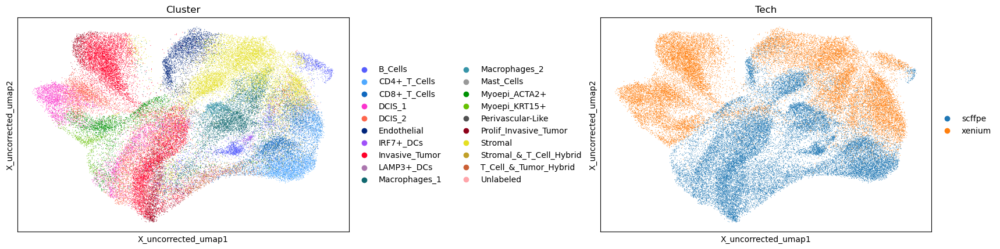

In [38]:
sc.pl.embedding(adata, basis='X_uncorrected_umap', color=['Cluster', 'Tech'], wspace=.6)

### Batch integration methods

#### Combat


Combat is a batch integration method originally developed for microarray dataset. It belongs to the family of linear methods that attempt to mitigate technical effects by adjusting for individual batches for their mean and scale (standard deviation). In other words, Combat assumes that the batch effects can be factored out by standardizing means and variances across batches. Importantly, Combat achieves robustness by pooling information across genes using a empirical Bayes estimator. Generally, Combat works best on small data with moderate technical variation.

In [39]:
adata.layers['combat'] = sc.pp.combat(adata, key='Tech', inplace=False)

In [40]:
adata.obsm['X_combat'] = sc.pp.pca(adata.layers['combat'], n_comps=20)

In [41]:
umap(adata, basis='X_combat')

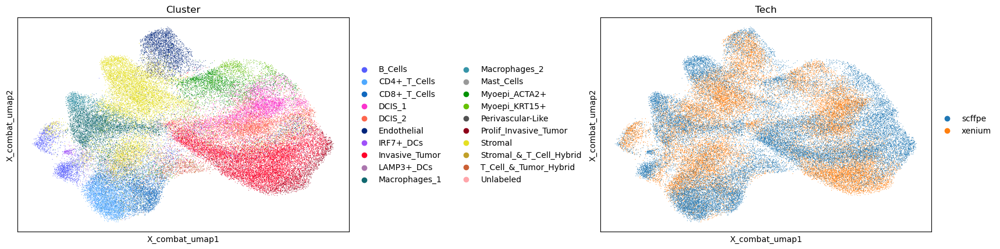

In [42]:
sc.pl.embedding(adata, basis='X_combat_umap', color=['Cluster', 'Tech'], wspace=.6)

#### Harmony

Harmony uses PCA factors (cell embeddings) as a starting point to cluster each cell to potentially multiple clusters (*soft-clustering*). After this first step, each dataset contains cluster-specific centroids which correspond to cell types. These centroids are then used to compute cluster-specific linear correction factors that are are applied to each cell. This procedure is iterated until the clusters are stable. Harmony has been reported to be appropriate for simple integration tasks with distinct batch and biological structure.

In [43]:
sce.pp.harmony_integrate(adata, basis='X_uncorrected', key='Tech')

2024-01-30 09:18:27,474 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-30 09:18:34,740 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-30 09:18:35,178 - harmonypy - INFO - Iteration 1 of 10
2024-01-30 09:20:22,274 - harmonypy - INFO - Iteration 2 of 10
2024-01-30 09:22:07,681 - harmonypy - INFO - Iteration 3 of 10
2024-01-30 09:23:55,282 - harmonypy - INFO - Iteration 4 of 10
2024-01-30 09:25:44,777 - harmonypy - INFO - Iteration 5 of 10
2024-01-30 09:27:33,884 - harmonypy - INFO - Iteration 6 of 10
2024-01-30 09:28:37,476 - harmonypy - INFO - Iteration 7 of 10
2024-01-30 09:29:31,777 - harmonypy - INFO - Iteration 8 of 10
2024-01-30 09:31:18,980 - harmonypy - INFO - Iteration 9 of 10
2024-01-30 09:33:07,083 - harmonypy - INFO - Iteration 10 of 10
2024-01-30 09:34:05,585 - harmonypy - INFO - Converged after 10 iterations


In [44]:
umap(adata, basis='X_pca_harmony')

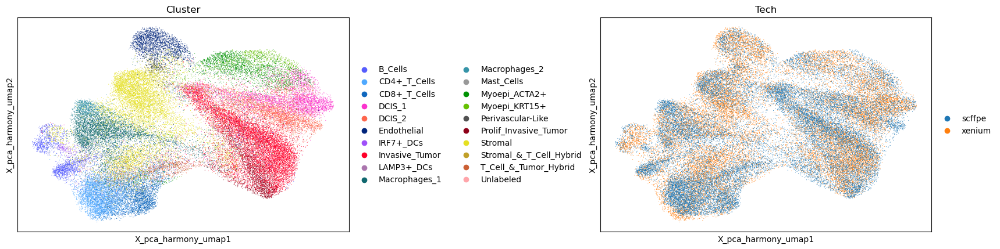

In [45]:
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color=['Cluster', 'Tech'], wspace=.6)

#### Scanorama


Scanorama differentiates itself from other batch-integration tools by relaxing the prior assumptions that all batches contain at least one shared cell type. Conceptually, Scanorama employs approaches from computer vision algorithms designed for panorama stitching but fundamentally aligns batches by mutal nearest-neighbors matching. Luetcken et. al. advise Scanorama for more complex integration tasks.

In [46]:
idx = adata.obs.sort_values("Tech").index
adata = adata[idx]

In [47]:
sce.pp.scanorama_integrate(adata, key='Tech', basis='X_uncorrected')

[[0.         0.62083957]
 [0.         0.        ]]
Processing datasets scffpe <=> xenium


In [48]:
umap(adata, basis='X_scanorama')

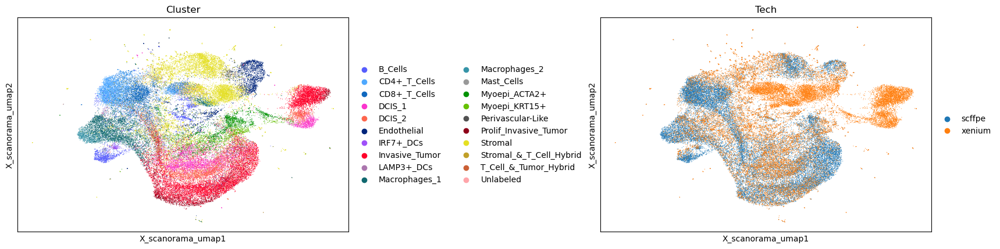

In [49]:
sc.pl.embedding(adata, basis='X_scanorama_umap', color=['Cluster', 'Tech'], wspace=.6)

#### BBKNN

In contrast to most other approaches BBKNN operates directly operates on the nearest neighbourhood representation (KNN) graph representation of the data. BBKNN computes the KNN graph on each batch individually so that each cell has an independent pool of neighbours and subsequently merges those neighbourhood sets across batches.

In [50]:
sce.pp.bbknn(adata, batch_key='Tech', use_rep='X_uncorrected')

In [51]:
# BBKNN returns a corrected KNN-graph. To keep the structure of our anndata object consistent we'll copy the graph and its associated meta data ...
adata.obsp['X_bbknn_distances'] = adata.obsp['distances']
adata.obsp['X_bbknn_connectivities'] = adata.obsp['connectivities']
adata.uns['X_bbknn'] = adata.uns['neighbors']
adata.uns['X_bbknn']['distances_key'] = 'X_bbknn_distances'
adata.uns['X_bbknn']['connectivities_key'] = 'X_bbknn_connectivities'

In [52]:
# ... and delete the original keys created by the scp.pp.bkknn function.
del adata.obsp['distances']
del adata.obsp['connectivities']
del adata.uns['neighbors']

In [53]:
sc.tl.umap(adata, neighbors_key='X_bbknn')

In [54]:
adata.obsm['X_bbknn_umap'] = adata.obsm['X_umap']

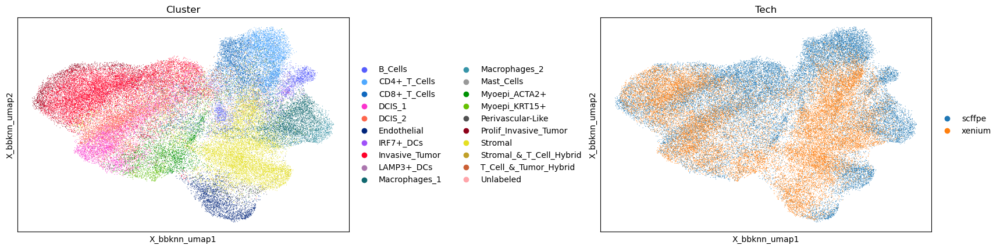

In [56]:
sc.pl.embedding(adata, basis='X_bbknn_umap', color=['Cluster', 'Tech'], wspace=.6)

#### SCVI

scVI employs a more complex model architecture called variational autoencoder. Here the transcriptome of each cell is encoded through a non-linear function (encoder) into a low-dimensional vector of normal random variables. This representation is then used by another non-linear transformation (decoder) to predict the gene actual counts of each cell. 

In [57]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Tech")

In [58]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=20, gene_likelihood="nb")

In [59]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 148/148: 100%|██████████| 148/148 [05:46<00:00,  2.32s/it, v_num=1, train_loss_step=227, train_loss_epoch=221]

`Trainer.fit` stopped: `max_epochs=148` reached.


Epoch 148/148: 100%|██████████| 148/148 [05:46<00:00,  2.34s/it, v_num=1, train_loss_step=227, train_loss_epoch=221]


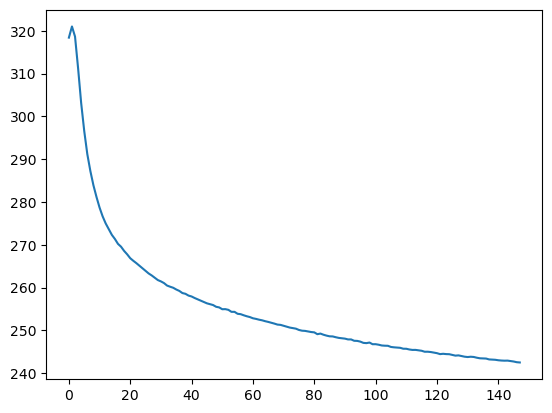

In [60]:
plt.plot(model.history["elbo_train"])
# plt.plot(model.history["elbo_"])

In [61]:
adata.obsm["X_scVI"] = model.get_latent_representation()

In [62]:
umap(adata, basis='X_scVI')

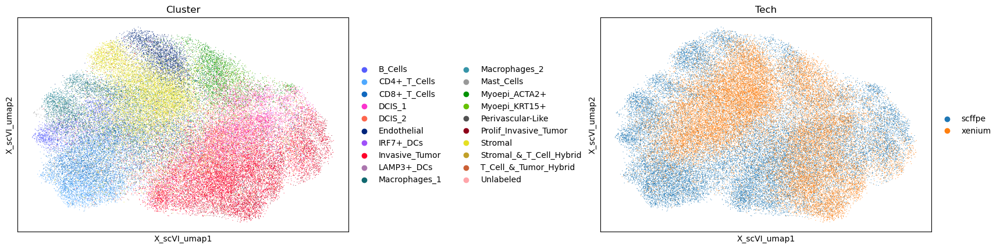

In [63]:
sc.pl.embedding(adata, basis='X_scVI_umap', color=['Cluster', 'Tech'], wspace=.6)

#### Bonus: scANVI

In [64]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="Cluster",
    unlabeled_category="Unknown",
)

In [65]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [02:08<00:00,  6.35s/it, v_num=1, train_loss_step=318, train_loss_epoch=326]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [02:08<00:00,  6.44s/it, v_num=1, train_loss_step=318, train_loss_epoch=326]


In [66]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

In [67]:
umap(adata, basis='X_scANVI')

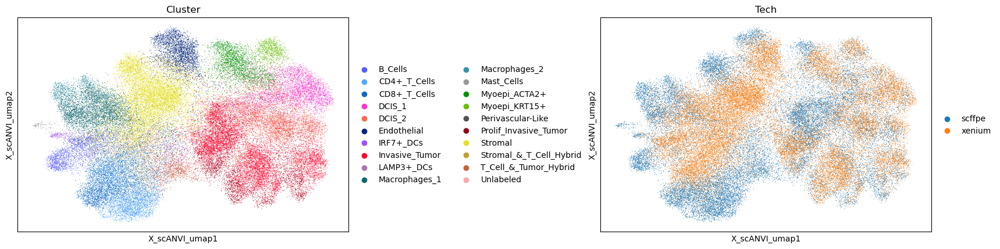

In [68]:
sc.pl.embedding(adata, basis='X_scANVI_umap', color=['Cluster', 'Tech'], wspace=.6)

### Summary

(0.0, 1.0, 0.0, 1.0)

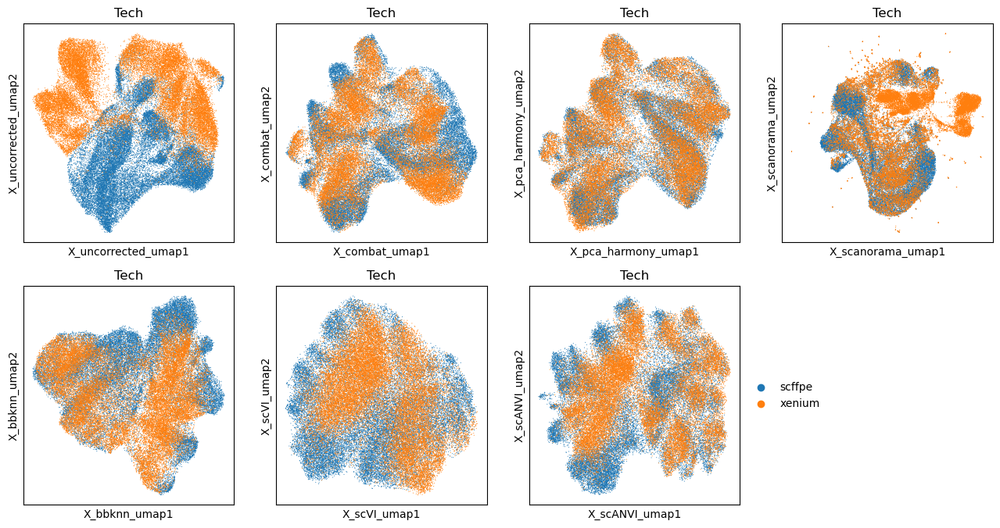

In [69]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

sc.pl.embedding(adata, basis='X_uncorrected_umap', color='Tech', ax=ax.flatten()[0], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_combat_umap', color='Tech', ax=ax.flatten()[1], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color='Tech', ax=ax.flatten()[2], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scanorama_umap', color='Tech', ax=ax.flatten()[3], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_bbknn_umap', color='Tech', ax=ax.flatten()[4], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scVI_umap', color='Tech', ax=ax.flatten()[5], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scANVI_umap', color='Tech', ax=ax.flatten()[6], show=False)
ax.flatten()[7].axis('off')

(0.0, 1.0, 0.0, 1.0)

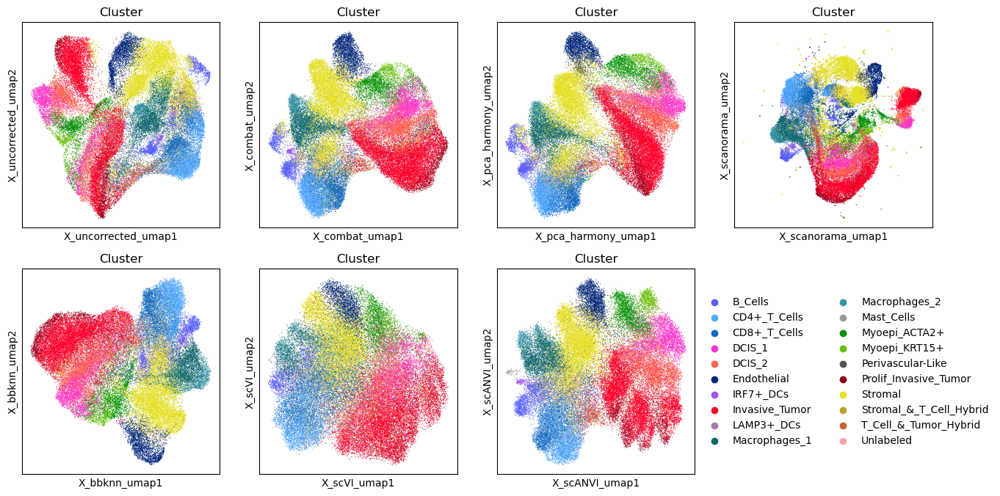

In [70]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

sc.pl.embedding(adata, basis='X_uncorrected_umap', color='Cluster', ax=ax.flatten()[0], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_combat_umap', color='Cluster', ax=ax.flatten()[1], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color='Cluster', ax=ax.flatten()[2], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scanorama_umap', color='Cluster', ax=ax.flatten()[3], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_bbknn_umap', color='Cluster', ax=ax.flatten()[4], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scVI_umap', color='Cluster', ax=ax.flatten()[5], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scANVI_umap', color='Cluster', ax=ax.flatten()[6], show=False)
ax.flatten()[7].axis('off')

In [72]:
bm = Benchmarker(
    adata,
    batch_key="Tech",
    label_key="Cluster",
    embedding_obsm_keys=["X_uncorrected", "X_combat", "X_pca_harmony", "X_scanorama", "X_bbknn_umap", "X_scVI", "X_scANVI"],
    n_jobs=-1,
)

In [73]:
bm.benchmark()

Metrics:  60%|██████    | 6/10 [00:49<00:24,  6.15s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:33<00:12,  3.06s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:29<00:11,  2.77s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:30<00:11,  2.81s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:18<00:07,  1.90s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:23<00:08,  2.21s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:  60%|██████    | 6/10 [00:24<00:09,  2.30s/it, Batch correction: kbet_per_label]

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Embeddings: 100%|██████████| 7/7 [14:33<00:00, 124.78s/it]tch correction: pcr_comparison]

                                                                                         

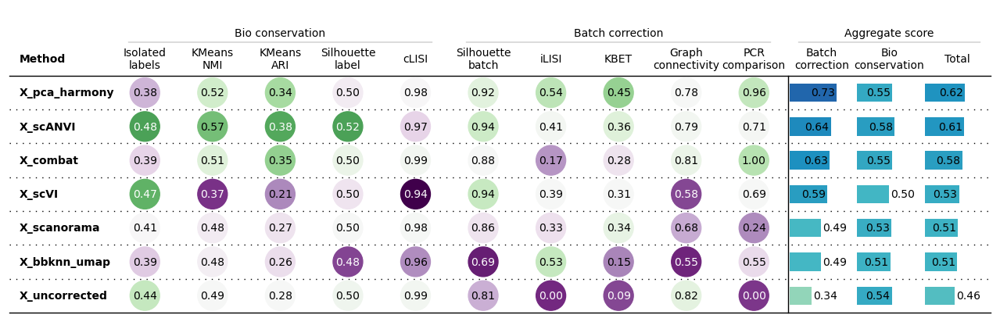

In [74]:
bm.plot_results_table(min_max_scale=False)


In [82]:
bm.get_results().to_csv('/g/huber/www-huber/users/harald/embo/benchmark.csv')

In [80]:
adata.write_h5ad('/g/huber/www-huber/users/harald/embo/integrated.h5ad')